In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

import sys
import numpy as np
import torch
import os
import pandas as pd
import matplotlib.pyplot as plt

from isegm.utils import vis, exp

from isegm.inference import utils
from isegm.inference.evaluation import evaluate_dataset, evaluate_sample
from isegm.inference.predictors import get_predictor


# View IoU scores

In [2]:
def get_run_results(run_path):
    
    res = []
    
    for dir in os.listdir(run_path):
        if os.path.isdir(os.path.join(run_path, dir)):
            run_dir = os.path.join(run_path, dir)
            with open(os.path.join(run_dir, '.hydra', 'overrides.yaml')) as f:
                run_cfg = f.readlines()
            summary = pd.read_csv(os.path.join(run_dir, 'summary.csv'))
            res.append((run_cfg, summary))
            
    cfgs = [r[0] for r in res]
    string_count = {}
    
    for array in cfgs:
        for string in array:
            if string in string_count:
                string_count[string] += 1
            else:
                string_count[string] = 1
    
    configs = []
    for array in cfgs:
        unique_array = [string for string in array if string_count[string] == 1]
        configs.append(unique_array)
        
    configs = [[line.split(' ')[1].strip() for line in c] for c in configs]
    configs = ['_'.join(c) for c in configs]
    
    res = [(c, r[1]) for c, r in zip(configs, res)]
    
    return res

In [4]:
general_run_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/multirun/2023-09-11/10-42-09'
train_run_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/multirun/2023-09-11/10-43-43'
general_run_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/multirun/2023-09-12/12-59-07'

In [5]:
eval_results = get_run_results(general_run_path)
print([r[0] for r in eval_results])

['start_progressive_merge=11', 'start_progressive_merge=1', 'start_progressive_merge=-1']


In [6]:
legend_keys = ['After 10 clicks', 'From the start', 'No merge']

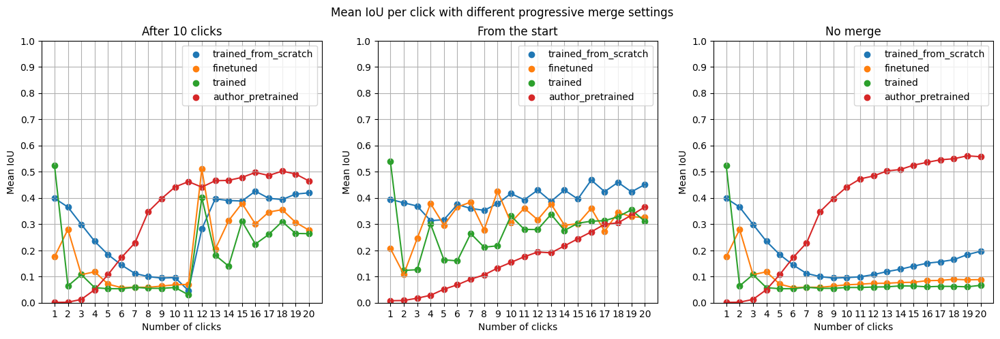

In [9]:
clicks = np.arange(1, 21)

fig, ax = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Mean IoU per click with different progressive merge settings')

for i, (title, run) in enumerate(eval_results):
    model_names = run.iloc[:, 0].values
    values = run.iloc[:, 1:].values
    ax[i].set_title(legend_keys[i])
    ax[i].set_xlabel('Number of clicks')
    ax[i].set_ylabel('Mean IoU')
    ax[i].set_xticks(clicks)
    ax[i].set_yticks(np.arange(0.0, 1.1, 0.1))
    ax[i].set_ylim([0.0, 1.0])
    for j, model_name in enumerate(model_names):
        ax[i].plot(clicks, values[j])
        ax[i].scatter(clicks, values[j], label=model_name)
    ax[i].legend()
    ax[i].grid()

In [18]:
def visualise_particular_click(model_name, click, run_path, legend_keys, dataset_name='LIDC_2D_VAL'):
    res = []
    
    for dir in os.listdir(run_path):
        if os.path.isdir(os.path.join(run_path, dir)):
            run_dir = os.path.join(run_path, dir)
            with open(os.path.join(run_dir, '.hydra', 'overrides.yaml')) as f:
                run_cfg = f.readlines()
            model_df = pd.read_csv(os.path.join(run_dir, 'ious', f'{model_name}_{dataset_name}.csv'))
            res.append((run_cfg, model_df))
            
    cfgs = [r[0] for r in res]
    string_count = {}
    
    for array in cfgs:
        for string in array:
            if string in string_count:
                string_count[string] += 1
            else:
                string_count[string] = 1
    
    configs = []
    for array in cfgs:
        unique_array = [string for string in array if string_count[string] == 1]
        configs.append(unique_array)
        
    configs = [[line.split(' ')[1].strip() for line in c] for c in configs]
    configs = ['_'.join(c) for c in configs]
    
    res = [(c, r[1]) for c, r in zip(configs, res)]
    
    click_dfs = [(c, r[[f'iou_{click}_clicks']].values.flatten()) for c, r in res]
    
    fig, ax = plt.subplots(1, len(click_dfs))
    for (name, df) in click_dfs:
        
                
visualise_particular_click('finetuned', 1, general_run_path, legend_keys)

[('start_progressive_merge=11',
  array([0.45403377, 0.        , 0.18061309, 0.        , 0.        ,
         0.35573123, 0.        , 0.        , 0.92651757, 0.        ,
         0.0973262 , 0.76409666, 0.29039071, 0.27272727, 0.        ,
         0.        , 0.53996983, 0.03783784, 0.0816078 , 0.08597285,
         0.        , 0.43243243, 0.12360867, 0.36312849, 0.12362031,
         0.30275229, 0.        , 0.        , 0.        , 0.32330827,
         0.        , 0.        , 0.00506329, 0.13270142, 0.        ,
         0.81020734, 0.64971751, 0.74647887, 0.02090357, 0.27152318,
         0.        , 0.        , 0.        , 0.43122677, 0.81265823,
         0.44444444, 0.        , 0.52331606, 0.19315895, 0.3642154 ,
         0.0312989 , 0.        , 0.61702128, 0.04552129, 0.00196464,
         0.49712644, 0.        , 0.        , 0.        , 0.13035382,
         0.        , 0.        , 0.        , 0.        , 0.64470588,
         0.34393638, 0.        , 0.        , 0.        , 0.        ,
  

# Visualise

In [31]:
device = torch.device('cuda:0')
cfg = exp.load_config_file('config.yml', return_edict=True)

In [36]:
# Possible choices: 'GrabCut', 'Berkeley', 'DAVIS', 'COCO_MVal', 'SBD', 'BRATS', 'LIDC', 'LIDC_2D_VAL', 'LIDC_2D_256_VAL
DATASET = 'LIDC_2D_VAL'
dataset = utils.get_dataset(DATASET, cfg)

EVAL_MAX_CLICKS = 20
MODEL_THRESH = 0.49

EVAL_MODELS = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/models_to_evaluate'

checkpoint_path = utils.find_checkpoint(cfg.INTERACTIVE_MODELS_PATH, 'trained_fixed')
model = utils.load_is_model(checkpoint_path, device)
brs_mode = 'FocalClick'
predictor = get_predictor(model, brs_mode, device, prob_thresh=MODEL_THRESH)

[0.76425856 0.76679343 0.00947226 0.00281906 0.31558514 0.36936936
 0.44342762 0.47251773 0.00238854 0.46067417 0.52397263 0.00267141
 0.5222222  0.43583062 0.56017315 0.5807899  0.60242087 0.62271416
 0.6635897  0.6890309 ]


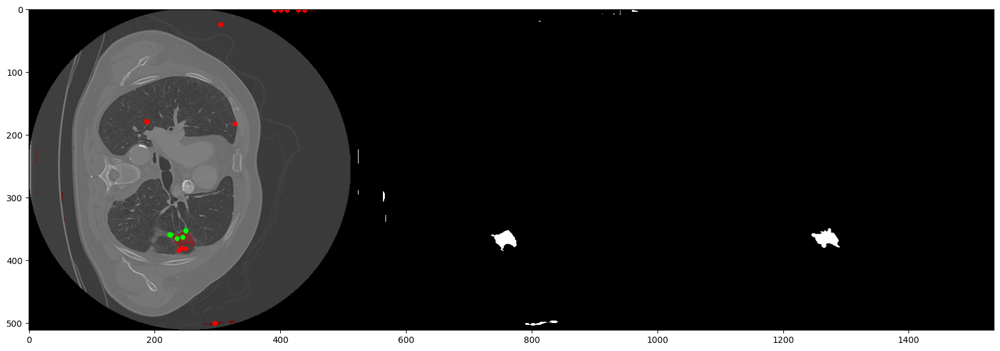

In [39]:
sample_id = 11
TARGET_IOU = 0.95
sample = dataset.get_sample(sample_id)
gt_mask = sample.gt_mask
image = sample.image
clicks_list, ious_arr, pred, pred_list = evaluate_sample(image, gt_mask, np.zeros_like(gt_mask), predictor, 
                                              pred_thr=MODEL_THRESH, 
                                              max_iou_thr=TARGET_IOU, max_clicks=EVAL_MAX_CLICKS,
                                              vis=False, start_progressive_merge_on_click=1)
pred_mask = pred > MODEL_THRESH
draw = vis.draw_with_blend_and_clicks(image[:, :, :3], mask=pred_mask, clicks_list=clicks_list)
draw = np.concatenate((draw,
    255 * pred_mask[:, :, np.newaxis].repeat(3, axis=2),
    255 * (gt_mask > 0)[:, :, np.newaxis].repeat(3, axis=2)
), axis=1)

print(ious_arr)

plt.figure(figsize=(20, 30))
plt.imshow(draw)
plt.show()

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import base64

In [41]:
def show_animation(animation):
    html = animation.to_jshtml()
    
    return HTML(html)

def show_animation_from_file(filename):
    
    with open(filename, 'rb') as f:
        gif_data = f.read()

    gif_base64 = base64.b64encode(gif_data).decode('utf-8')

    html_code = f'<img src="data:image/gif;base64,{gif_base64}">'
    return HTML(html_code)

def save_animation(animation, filename):
    animation.save(f'{filename}.gif', writer='pillow')

In [42]:
def generate_click_animation(image, gt_mask, iou_values, clicks, predictions):
    fig, ax = plt.subplots(1, 3, figsize=(24, 8))
        
    iou_values = np.append(np.array([0]), iou_values)
    
    num_frames = len(iou_values)
        
    ax[0].imshow(image, cmap='gray')
    ax[0].axis('off')
    ax[0].set_title('Clicks: 0', fontsize=20)
    ax[0].contour(gt_mask, colors='b', alpha=0.5, linewidths=0.1)
    
    ax[1].axis('off')
    ax[1].imshow(image, cmap='gray')
    ax[1].set_title(f'IOU: {0.}', fontsize=20)
    
    ax[2].set_xticks(np.arange(1, len(iou_values)+1))
    ax[2].set_ylim(0, 1.05)
    ax[2].set_xlabel('Clicks')
    ax[2].set_ylabel('IOU')
    ax[2].set_title('IOU after each click', fontsize=20)
    
    plt.close()
    
    def update(frame_index):
        ax[0].imshow(image, cmap='gray')
        ax[0].set_title(f'Clicks: {frame_index}', fontsize=20)
        ax[0].contour(gt_mask, colors='b', alpha=0.5, linewidths=0.1)
        for click in clicks[:frame_index]:
            color = 'lime' if click.is_positive else 'r'
            y, x = click.coords
            ax[0].scatter(x, y, s=20, c=color)
        
        ax[1].imshow(image, cmap='gray')
        if (frame_index > 0):
            prediction_masked = np.ma.masked_where(predictions[frame_index-1] == 0, predictions[frame_index-1])
            ax[1].imshow(prediction_masked, alpha=0.5, cmap='gist_rainbow')
            ax[1].set_title(f'IOU: {iou_values[frame_index]:.3f}', fontsize=20)
            
        ax[2].plot(np.arange(frame_index + 1), iou_values[:frame_index + 1], color='b')
        
        return
    
    animation = FuncAnimation(fig, update, frames=num_frames, interval=1000, blit=False)
    return animation
    

In [43]:
anim = generate_click_animation(image, gt_mask, ious_arr, clicks_list, pred_list)
show_animation(anim)